# Cam tests

## Custom Parameters
Here you can change some of the main parameters of the model

In [1]:
width = 240
height = 240

epochs = 15

batch_size = 8
learning_rate = 0.001

new_aug_epoch_distance = 5 #how many epochs between new augmentations
number_of_augmentations = 3

show_images = True

In [2]:
OPENSLIDE_PATH = r'D:\Estudos\IC\Libraries\openslide-bin-4.0.0.3-windows-x64\openslide-bin-4.0.0.3-windows-x64\bin'

import os
if hasattr(os, 'add_dll_directory'):
    with os.add_dll_directory(OPENSLIDE_PATH):
        import openslide
else:
    import openslide

### Imports

In [3]:
import sys
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.cuda.amp as amp
from torch.utils.data import DataLoader
from tqdm import tqdm
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
from torchvision import ops
from torchvision.transforms import ToTensor, ToPILImage
from torchvision.utils import save_image
import torchvision.transforms.functional as TF
from albumentations.pytorch import ToTensorV2
import albumentations as A
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50, ResNet50_Weights


sys.path.append(r'D:\Estudos\IC\CNN\CNN\Model')
from TrainingDataArrangement import arrange_data
import CustomDataset
from UNetModel import UNet
from DaliDataAug import load_pil_image, data_augmentation


#defining device
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.18 (you have 1.4.8). Upgrade using: pip install --upgrade albumentations


Using cuda device


### Setting the seed

In [4]:
def set_seed(seed):  
    random.seed(seed) #setting for albumentations
    np.random.seed(seed)
    
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(727)

### Getting the dataset

C:\Users\Gabriel\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pydantic\main.py:347: UserWarning: Pydantic serializer warnings:
  Expected `Union[float, tuple[float, float]]` but got `list` - serialized value may not be as expected
  Expected `Union[float, tuple[float, float]]` but got `list` - serialized value may not be as expected
  Expected `Union[float, tuple[float, float]]` but got `list` - serialized value may not be as expected
  Expected `Union[float, tuple[float, float]]` but got `list` - serialized value may not be as expected
  return self.__pydantic_serializer__.to_python(


Target path already exists. Please delete it first if you want to re-arrange the data, exiting...
Target path already exists. Please delete it first if you want to re-arrange the data, exiting...
Target path already exists. Please delete it first if you want to re-arrange the data, exiting...
Showing images: True
Getting the images
Converting images to tensors


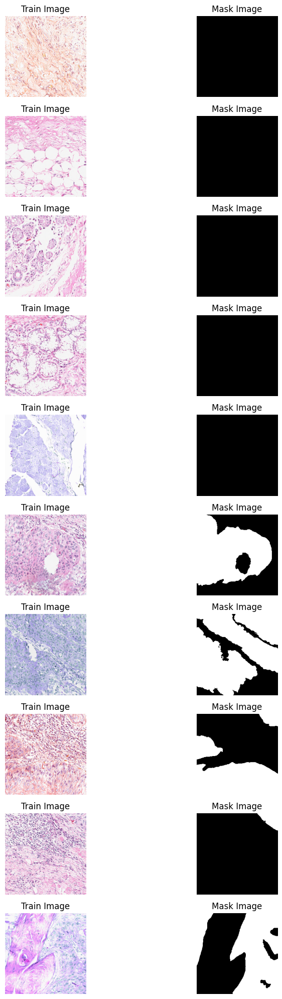

In [5]:
#getting path references
testing_folders = [
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009009\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009010x1000902\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009011\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009014\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009016x1000903\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009023\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009009\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009010x1000902\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009011\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009014\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009016x1000903\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009023\02-non_roi"
]

training_folders = [
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009009\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009010x1000902\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009011\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009014\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009016x1000903\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009023\01-roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009009\02-non_roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009010x1000902\02-non_roi",
    # # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009011\02-non_roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009014\02-non_roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009016x1000903\02-non_roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009023\02-non_roi"
]
resnet_training_folders = [
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009009\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009010x1000902\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009011\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009014\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009016x1000903\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009023\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009009\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009010x1000902\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009011\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009014\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009016x1000903\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009023\02-non_roi"
]


updated_training_folders = []
updated_testing_folders = []
updated_resnet_training_folders = []

for training_folder, testing_folder in zip(training_folders, testing_folders):
    original_training_folder = training_folder + "\\01-original"
    mask_training_folder = training_folder + "\\02-mask"
    updated_training_folders.extend([original_training_folder, mask_training_folder])

    original_testing_folder = testing_folder + "\\01-original"
    mask_testing_folder = testing_folder + "\\02-mask"
    updated_testing_folders.extend([original_testing_folder, mask_testing_folder])

for training_folder in resnet_training_folders:
    original_training_folder = training_folder + "\\01-original"
    mask_training_folder = training_folder + "\\02-mask"
    updated_resnet_training_folders.extend([original_training_folder, mask_training_folder])

training_path = r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\training"
test_path = r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing"
resnet_training_path = r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\resnet_training"

arrange_data(test_path,updated_testing_folders)
arrange_data(training_path,updated_training_folders)
arrange_data(resnet_training_path,updated_resnet_training_folders)

#data augmentation
augmentation_transform = A.Compose([
    #A.ToPIL(),
    A.Resize(width = width, height = height, p=1.0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.25),
    A.RandomRotate90(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    A.Transpose(p=0.25),
    #A.RandomResizedCrop(224, 224, scale=(0.8, 1.0)),
    # A.GridDistortion(num_steps=5, distort_limit=(-0.3, 0.3), interpolation=1, border_mode=4, p=0.3),
    # A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, interpolation=1, border_mode=4, p=0.3),
    # A.OpticalDistortion(distort_limit=(-0.05, 0.05), shift_limit=(-0.05, 0.05), interpolation=1, border_mode=4, p=0.3),
    # A.Perspective(scale=(0.05, 0.1), keep_size=True, pad_mode=0, pad_val=0, mask_pad_val=0, fit_output=False, interpolation=1, p=0.3),
    # A.PiecewiseAffine (scale=(0.03, 0.05), nb_rows=4, nb_cols=4, interpolation=1, mask_interpolation=0, cval=0, cval_mask=0, mode='constant', absolute_scale=False, keypoints_threshold=0.01, p=0.1),
    # A.ShiftScaleRotate (shift_limit=(-0.0625, 0.0625), scale_limit=(-0.1, 0.1), rotate_limit=(-45, 45), interpolation=1, border_mode=4, value=0, mask_value=0, rotate_method='largest_box', p=0.15),
    ToTensorV2()  # loading image to tensor and normalization
])
test_transform = A.Compose([
    #A.ToPIL(),
    A.Resize(width = width, height = height, p=1.0),
    #A.HorizontalFlip(p=0.5),
    #A.VerticalFlip(p=0.25),
    #A.RandomRotate90(p=0.5),
    #A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    #A.Transpose(p=0.5),
    #A.RandomResizedCrop(224, 224, scale=(0.8, 1.0)),
    ToTensorV2()  # loading image to tensor and normalization
])

print("Showing images:", show_images)

print("Getting the images")
training_dataset = CustomDataset.CustomImageDataset(training_path + "\\images", training_path + "\\masks", transform=augmentation_transform)
test_dataset = CustomDataset.CustomImageDataset(test_path + "\\images", test_path + "\\masks", transform=test_transform)

resnet_dataset = CustomDataset.CustomImageDataset(resnet_training_path + "\\images", resnet_training_path + "\\masks", transform=augmentation_transform)
resnet_dataloader = DataLoader(resnet_dataset, batch_size=batch_size, shuffle=True)

print("Converting images to tensors")
train_dataloader = DataLoader(training_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset , batch_size=batch_size, shuffle=False)
if(show_images):
    num_images_to_display = 10
    fig, axs = plt.subplots(num_images_to_display, 2, figsize=(10, 20))
    for i in range(num_images_to_display):
        train_image, mask_image = training_dataset[i]
        train_image = train_image.permute(1, 2, 0).numpy()

        axs[i, 0].imshow(train_image)
        axs[i, 0].set_title('Train Image')
        axs[i, 0].axis('off')

        mask_image = mask_image.squeeze(0).numpy()
        axs[i, 1].imshow(mask_image, cmap='gray')
        axs[i, 1].set_title('Mask Image')
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()


### Dir Checker

In [6]:

def dir_checker_and_restarter(images_dir):
    os.makedirs(images_dir, exist_ok=True)
    for filename in os.listdir(images_dir): #deleting all previous images files
        file_path = os.path.join(images_dir, filename)
        try:
            if os.path.isfile(file_path):
                os.remove(file_path)
        except Exception as e:
            print(f"Failed to delete {file_path}. Reason: {e}")

def save_image(image, path):
    image.save(path)

def recreate_data_loader(number_of_augmentations = 5):
    input_dir_train = r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\training"
    output_dir_train = r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\training\transformed"

    input_dir_test = r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing"
    output_dir_test = r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\transformed"

    main_dirs = [output_dir_train, output_dir_test]

    for dir in main_dirs:
        if not os.path.exists(dir):
            os.makedirs(dir + "\images")
            os.makedirs(dir + "\masks")
        else:
            dir_checker_and_restarter(dir)

    augmentation = ["horizontal_flip", "vertical_flip", "rotation", "transpose"]

    img_input_size = (640, 640)
    img_output_size = (width, height)

    input_output_mapping = {
        "training": output_dir_train,
        "testing": output_dir_test
    }

    dirs = [input_dir_train, input_dir_test]
    for i in range(number_of_augmentations):
        for dir in dirs:
            img_path_appended = os.path.join(dir, "images")
            mask_path_appended = os.path.join(dir, "masks")

            image_files = [f for f in os.listdir(img_path_appended) if f.endswith(('.jpg', '.png', '.jpeg', 'tif'))]
            mask_files = [f for f in os.listdir(mask_path_appended) if f.endswith(('.jpg', '.png', '.jpeg', 'tif'))]

            for img_name, mask_name in zip(image_files, mask_files):
                img_path = os.path.join(img_path_appended, img_name)
                mask_path = os.path.join(mask_path_appended, mask_name)

                input_image = load_pil_image(img_path, False)
                mask = load_pil_image(mask_path, False)

                target_image = None
                GAN_model = None

                augmented_img, augmented_mask, used_augmentations = data_augmentation(input_image, target_image, mask, img_input_size, img_output_size, augmentation, GAN_model)

                for key in input_output_mapping:
                    if key in dir:
                        output_dir = input_output_mapping[key]
                        break
                    
                output_img_path = os.path.join(output_dir, f"images\\aug{i}_{img_name}")
                output_mask_path = os.path.join(output_dir, f"masks\\aug{i}_{mask_name}")
                save_image(TF.to_pil_image(augmented_img), output_img_path)
                save_image(TF.to_pil_image(augmented_mask), output_mask_path)
    print(f"Finished loading {number_of_augmentations} new augmentations in the whole dataset")
                



    training_dataset = CustomDataset.CustomImageDataset(output_dir_train + "\\images", output_dir_train + "\\masks", transform=test_transform)
    test_dataset = CustomDataset.CustomImageDataset(output_dir_test + "\\images", output_dir_test + "\\masks", transform=test_transform)
    train_dataloader = DataLoader(training_dataset, batch_size=batch_size, shuffle=True)
    test_dataloader = DataLoader(test_dataset , batch_size=batch_size, shuffle=False)
    return train_dataloader, test_dataloader
train_dataloader, test_dataloader = recreate_data_loader(number_of_augmentations)
    

Finished loading 3 new augmentations in the whole dataset


### Setting GradCAM

In [7]:
gradcam_width = width
gradcam_height = height

def save_and_display_gradcam(img_path, heatmap, alpha=0.6):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (gradcam_width, gradcam_height))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    mask_path = img_path.replace(r"\testing\images", r"\testing\masks")
    mask = cv2.imread(mask_path)
    mask = cv2.resize(mask, (gradcam_width, gradcam_height))

    superimposed_img = cv2.addWeighted(heatmap, alpha, img, 1 - alpha, 0)

    plt.figure(figsize=(10, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.title('GradCAM')
    plt.axis('off')
    plt.tight_layout()

    plt.subplot(1, 2, 2)
    plt.imshow(img)
    plt.imshow(mask, alpha=0.5)
    plt.title("Original Mask With Image")
    plt.axis('off')
    plt.show()

def make_gradcam_heatmap(img_tensor, model, target_layer):
    model.eval()
    
    features = None
    gradients = None
    
    def forward_hook(module, input, output):
        nonlocal features
        features = output
    
    def backward_hook(module, grad_in, grad_out):
        nonlocal gradients
        gradients = grad_out[0]
    
    handle_forward = target_layer.register_forward_hook(forward_hook)
    handle_backward = target_layer.register_full_backward_hook(backward_hook)
    
    with amp.autocast():
        preds = model(img_tensor)
        pred_class = preds.argmax(dim=1)
    
    model.zero_grad()
    class_score = preds[:, pred_class].squeeze().sum()
    class_score.backward(retain_graph=True)
    
    handle_forward.remove()
    handle_backward.remove()
    
    pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])
    for i in range(features.shape[1]):
        features[:, i, :, :] *= pooled_gradients[i]
    
    heatmap = features.mean(dim=1).squeeze()
    heatmap = np.maximum(heatmap.detach().cpu().numpy(), 0)
    epsilon = 1e-8
    heatmap_max = np.max(heatmap)
    heatmap = heatmap / (heatmap_max + epsilon)
    
    del features, gradients
    torch.cuda.empty_cache()
    
    return heatmap

def make_prediction_and_visualize(image_paths):
    for img_path in image_paths:
        img = cv2.imread(img_path)
        img = cv2.resize(img, (gradcam_width, gradcam_height))
        img_tensor = torch.tensor(img / 255.0).permute(2, 0, 1).unsqueeze(0).float()

        target_layer = model.upconv2

        heatmap = make_gradcam_heatmap(img_tensor.to(device), model, target_layer)

        save_and_display_gradcam(img_path, heatmap)

def generate_heatmap(img_path): 
    img = cv2.imread(img_path)
    img = cv2.resize(img, (gradcam_width, gradcam_height))
    img_tensor = torch.tensor(img / 255.0).permute(2, 0, 1).unsqueeze(0).float()
    target_layer = model.upconv2
    return make_gradcam_heatmap(img_tensor.to(device), model, target_layer)

def generate_heatmap_with_tensor(img): 
    target_layer = model.upconv2
    return make_gradcam_heatmap(img.unsqueeze(0), model, target_layer)





# image_paths = [
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r27c5.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r27c10.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r28c12.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r31c0.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r31c1.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r35c4.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r35c8.png",
#     r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing\images\1009009_r35c10.png",
# ]

# make_prediction_and_visualize(image_paths)




### Setting ResNet

In [8]:
from pytorch_grad_cam import GradCAM, HiResCAM, GradCAMElementWise, GradCAMPlusPlus, XGradCAM, AblationCAM, ScoreCAM
from pytorch_grad_cam import EigenCAM, EigenGradCAM, LayerCAM, FullGrad
from pytorch_grad_cam.utils.image import show_cam_on_image


def generate_ResNet_CAM(model, image, index, cam_layer, cam_type = "gradcam"):
    target_layers = cam_layer
    
    input_tensor = image

    targets = [ClassifierOutputTarget(1)]

    def denormalize(image):
        mean = torch.tensor([0.485, 0.456, 0.406]).to(device).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).to(device).view(3, 1, 1)

        image = image * std + mean
        return image

    def to_numpy_uint8(image):
        image = image.detach().cpu().numpy()
        image = np.transpose(image, (1, 2, 0))
        image = np.clip(image, 0, 1)
        image = (image * 255).astype(np.uint8)
        return image

    image_to_show = denormalize(image[index])
    image_to_show = to_numpy_uint8(image_to_show)
    image_to_show = image_to_show / 255

    match cam_type.lower():
            case "gradcam":
                with GradCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "hirescam":
                with HiResCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "gradcamelementwise":
                with GradCAMElementWise(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "gradcam++":
                with GradCAMPlusPlus(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "xgradcam":
                with XGradCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "ablationcam":
                with AblationCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "scorecam":
                with ScoreCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "eigencam":
                with EigenCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "eigengradcam":
                with EigenGradCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case "layercam":
                with LayerCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            case _:
                raise ValueError(f"CAM type '{cam_type}' invalid")
    
    grayscale_cam = grayscale_cam[0, :]
    return show_cam_on_image(image_to_show, grayscale_cam, use_rgb=True)

In [9]:



model_resnet = resnet50(pretrained=True)
model_resnet.fc = nn.Linear(model_resnet.fc.in_features, 2)
model_resnet = model_resnet.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_resnet.parameters(), lr=1e-4)

resnet_epochs = epochs #// 2

train_losses = []
train_accuracies = []

for epoch in range(resnet_epochs):
    model_resnet.train()
    running_loss = 0.0
    correct_predictions = 0
    total_predictions = 0

    for images, masks in tqdm(resnet_dataloader, desc=f'Epoch {epoch + 1}/{resnet_epochs}', leave=False):
        images, masks = images.to(device), masks.to(device)

        # Create labels: 1 if any mask > 0, else 0
        labels = torch.tensor([1 if torch.any(mask > 0) else 0 for mask in masks], dtype=torch.long, device=device)
        
        optimizer.zero_grad()
        outputs = model_resnet(images)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        # Accuracy
        preds = torch.argmax(outputs, dim=1)
        correct_predictions += (preds == labels).sum().item()
        total_predictions += labels.size(0)

    epoch_loss = running_loss / len(resnet_dataloader.dataset)
    epoch_accuracy = correct_predictions / total_predictions

    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_accuracy)

    print(f'Epoch {epoch + 1}/{resnet_epochs} - Loss: {epoch_loss:.4f} - Accuracy: {epoch_accuracy:.4f}')



C:\Users\Gabriel\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Gabriel\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/15 - Loss: 0.4197 - Accuracy: 0.8176


Epoch 2/15 - Loss: 0.3232 - Accuracy: 0.8574


Epoch 3/15 - Loss: 0.2842 - Accuracy: 0.8847


Epoch 4/15 - Loss: 0.2454 - Accuracy: 0.9057


Epoch 5/15 - Loss: 0.2569 - Accuracy: 0.8931


Epoch 6/15 - Loss: 0.2146 - Accuracy: 0.9119


Epoch 7/15 - Loss: 0.1816 - Accuracy: 0.9350


Epoch 8/15 - Loss: 0.1764 - Accuracy: 0.9308


Epoch 9/15 - Loss: 0.1879 - Accuracy: 0.9413


Epoch 10/15 - Loss: 0.2287 - Accuracy: 0.9119


Epoch 11/15 - Loss: 0.1575 - Accuracy: 0.9413


Epoch 12/15 - Loss: 0.1331 - Accuracy: 0.9455


Epoch 13/15 - Loss: 0.1516 - Accuracy: 0.9455


Epoch 14/15 - Loss: 0.1422 - Accuracy: 0.9476


Epoch 15/15 - Loss: 0.1341 - Accuracy: 0.9434


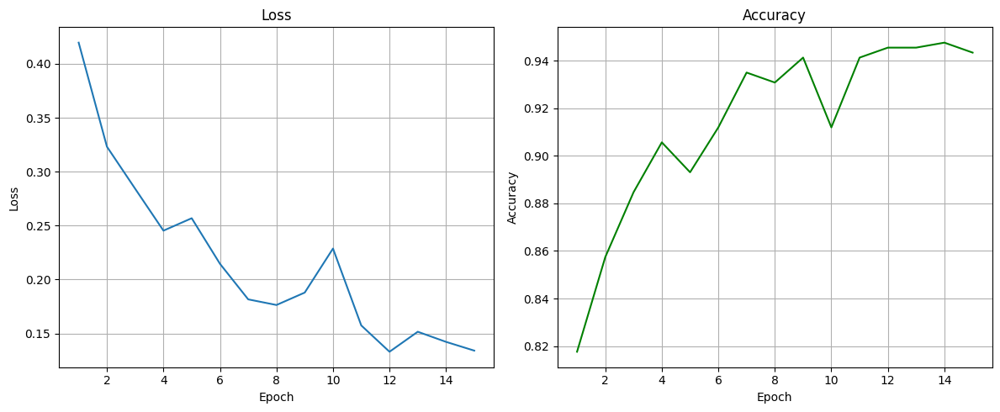

  0%|          | 0/155 [00:00<?, ?it/s]


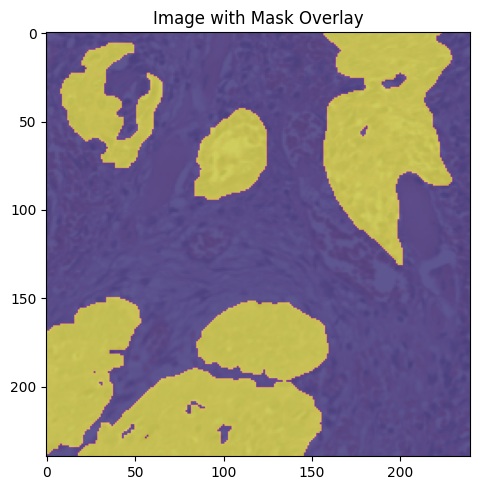

100%|██████████| 128/128 [00:05<00:00, 25.16it/s]


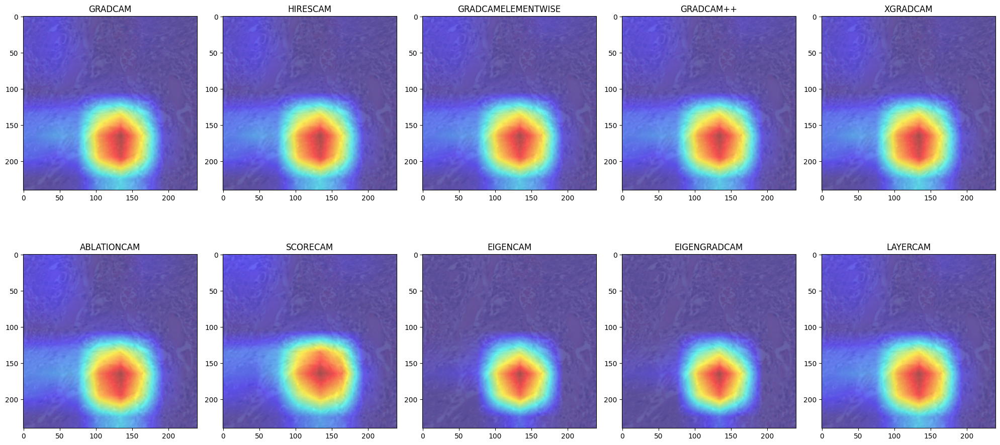

In [10]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, resnet_epochs + 1), train_losses, label='Training Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(range(1, resnet_epochs + 1), train_accuracies, color='green', label='Training Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)

plt.tight_layout()
plt.show()


image = []
mask = []

model_resnet.eval()
with torch.no_grad():
    for images, masks in tqdm(train_dataloader):
        images, masks = images.to(device), masks.to(device)
        if torch.any(masks > 0):
            test_image_resnet = images[0].detach()
            image = test_image_resnet
            mask = masks[0].detach()
            break

first_image_batch = test_image_resnet.unsqueeze(0)
plt.figure(figsize=(10, 5))

plt.subplot(1, 1, 1)
def denormalize(image):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = image.cpu().numpy().transpose((1, 2, 0))
    image = std * image + mean
    image = np.clip(image, 0, 1)
    return image

image_to_show = denormalize(image)
plt.imshow(image_to_show)
plt.imshow(mask.cpu().numpy()[0], alpha=0.5, cmap='plasma')
plt.title('Image with Mask Overlay')

plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 10))

cam_types = ["gradcam", "hirescam", "gradcamelementwise", "gradcam++", "xgradcam", "ablationcam", "scorecam", "eigencam", "eigengradcam", "layercam"]

for i, cam_type in enumerate(cam_types, 1):
    cam_image = generate_ResNet_CAM(model_resnet, first_image_batch, 0, [model_resnet.layer4[-1]], cam_type)
    
    plt.subplot(2, 5, i)  # Define a posição do subplot (2 linhas, 5 colunas)
    plt.imshow(cam_image)
    plt.title(cam_type.upper())

plt.tight_layout()
plt.show()

## Changing the CAM layer

### Layer 3 

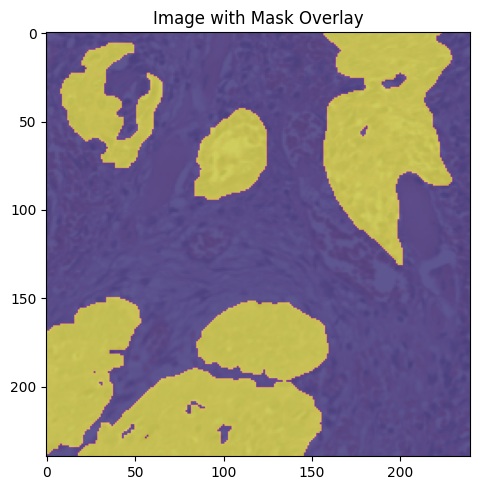

100%|██████████| 64/64 [00:02<00:00, 25.03it/s]


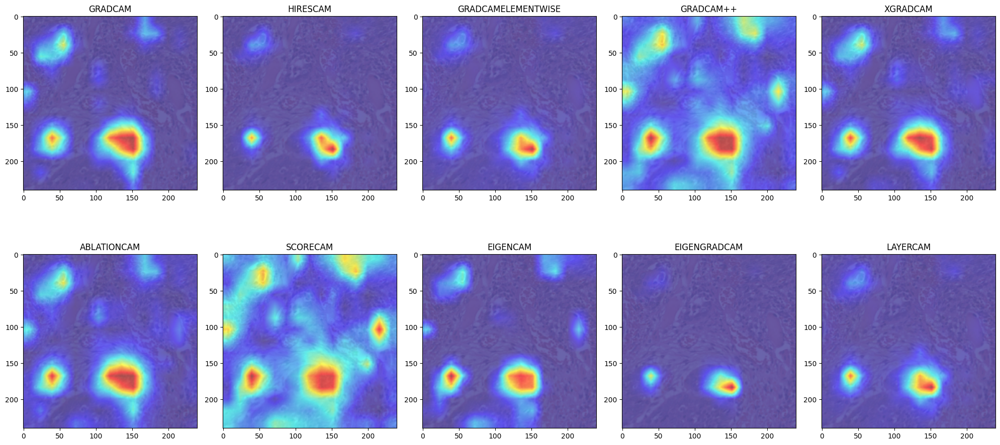

In [11]:
first_image_batch = test_image_resnet.unsqueeze(0)
plt.figure(figsize=(10, 5))

plt.subplot(1, 1, 1)
def denormalize(image):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = image.cpu().numpy().transpose((1, 2, 0))
    image = std * image + mean
    image = np.clip(image, 0, 1)
    return image

image_to_show = denormalize(image)
plt.imshow(image_to_show)
plt.imshow(mask.cpu().numpy()[0], alpha=0.5, cmap='plasma')
plt.title('Image with Mask Overlay')

plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 10))

cam_types = ["gradcam", "hirescam", "gradcamelementwise", "gradcam++", "xgradcam", "ablationcam", "scorecam", "eigencam", "eigengradcam", "layercam"]

for i, cam_type in enumerate(cam_types, 1):
    cam_image = generate_ResNet_CAM(model_resnet, first_image_batch, 0, [model_resnet.layer3[-1]], cam_type)
    
    plt.subplot(2, 5, i)  # Define a posição do subplot (2 linhas, 5 colunas)
    plt.imshow(cam_image)
    plt.title(cam_type.upper())

plt.tight_layout()
plt.show()

### Layer 4, -2

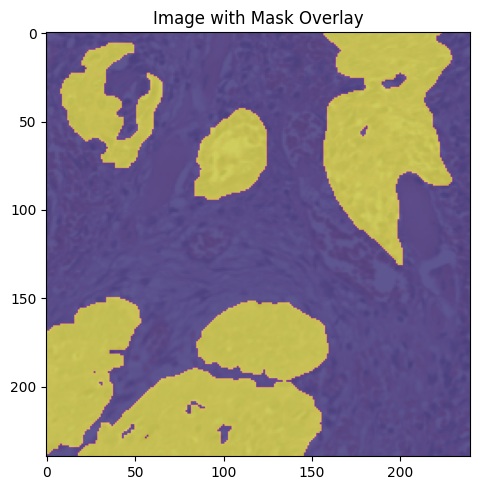

100%|██████████| 128/128 [00:04<00:00, 25.95it/s]


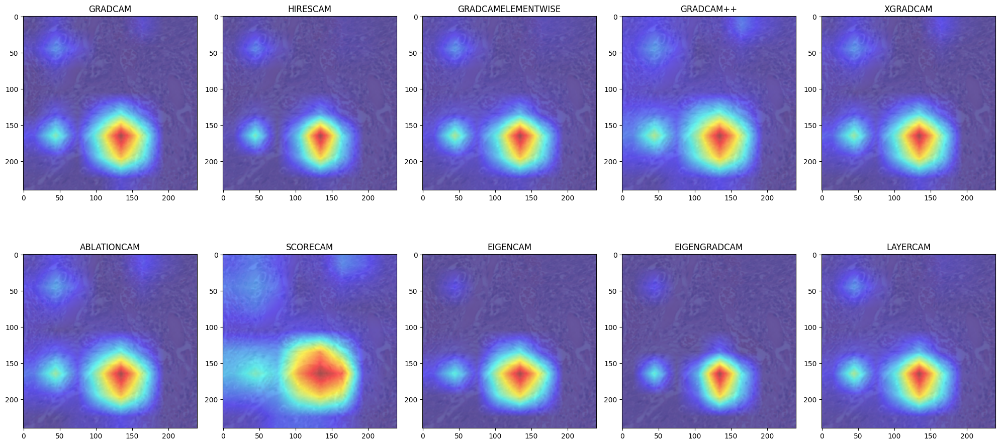

In [12]:
first_image_batch = test_image_resnet.unsqueeze(0)
plt.figure(figsize=(10, 5))

plt.subplot(1, 1, 1)
def denormalize(image):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = image.cpu().numpy().transpose((1, 2, 0))
    image = std * image + mean
    image = np.clip(image, 0, 1)
    return image

image_to_show = denormalize(image)
plt.imshow(image_to_show)
plt.imshow(mask.cpu().numpy()[0], alpha=0.5, cmap='plasma')
plt.title('Image with Mask Overlay')

plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 10))

cam_types = ["gradcam", "hirescam", "gradcamelementwise", "gradcam++", "xgradcam", "ablationcam", "scorecam", "eigencam", "eigengradcam", "layercam"]

for i, cam_type in enumerate(cam_types, 1):
    cam_image = generate_ResNet_CAM(model_resnet, first_image_batch, 0, [model_resnet.layer4[-2]], cam_type)
    
    plt.subplot(2, 5, i)  # Define a posição do subplot (2 linhas, 5 colunas)
    plt.imshow(cam_image)
    plt.title(cam_type.upper())

plt.tight_layout()
plt.show()

## Layer 3 - 2

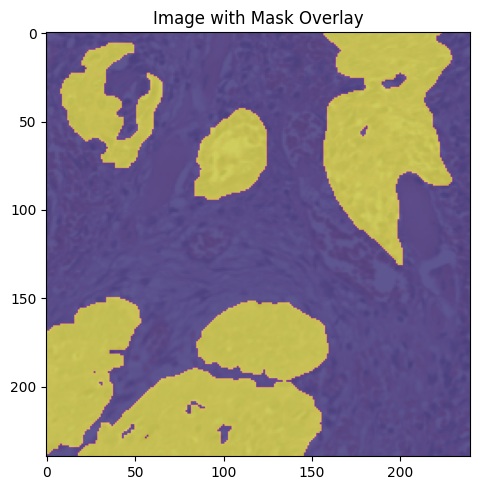

100%|██████████| 64/64 [00:02<00:00, 25.63it/s]


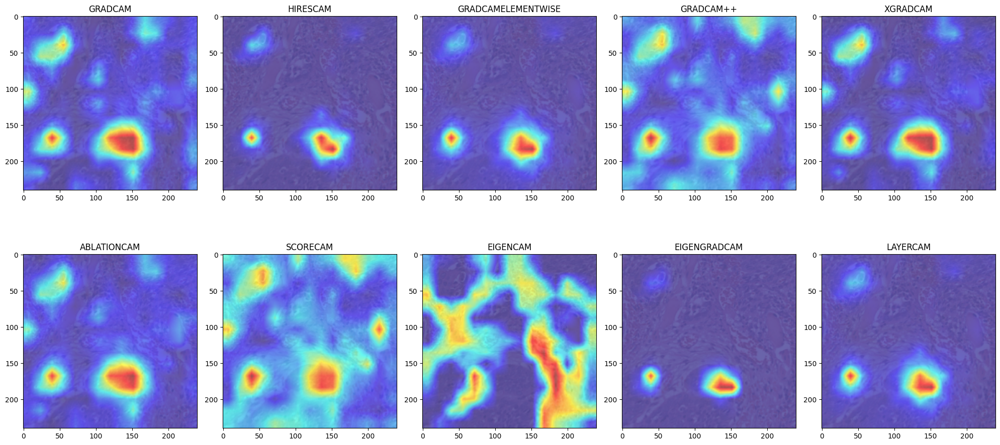

In [13]:
first_image_batch = test_image_resnet.unsqueeze(0)
plt.figure(figsize=(10, 5))

plt.subplot(1, 1, 1)
def denormalize(image):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = image.cpu().numpy().transpose((1, 2, 0))
    image = std * image + mean
    image = np.clip(image, 0, 1)
    return image

image_to_show = denormalize(image)
plt.imshow(image_to_show)
plt.imshow(mask.cpu().numpy()[0], alpha=0.5, cmap='plasma')
plt.title('Image with Mask Overlay')

plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 10))

cam_types = ["gradcam", "hirescam", "gradcamelementwise", "gradcam++", "xgradcam", "ablationcam", "scorecam", "eigencam", "eigengradcam", "layercam"]

for i, cam_type in enumerate(cam_types, 1):
    cam_image = generate_ResNet_CAM(model_resnet, first_image_batch, 0, [model_resnet.layer3[-2]], cam_type)
    
    plt.subplot(2, 5, i)  # Define a posição do subplot (2 linhas, 5 colunas)
    plt.imshow(cam_image)
    plt.title(cam_type.upper())

plt.tight_layout()
plt.show()

## Layer 2

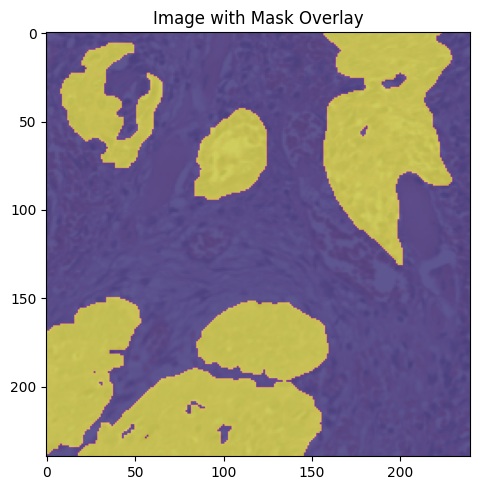

100%|██████████| 32/32 [00:01<00:00, 21.98it/s]


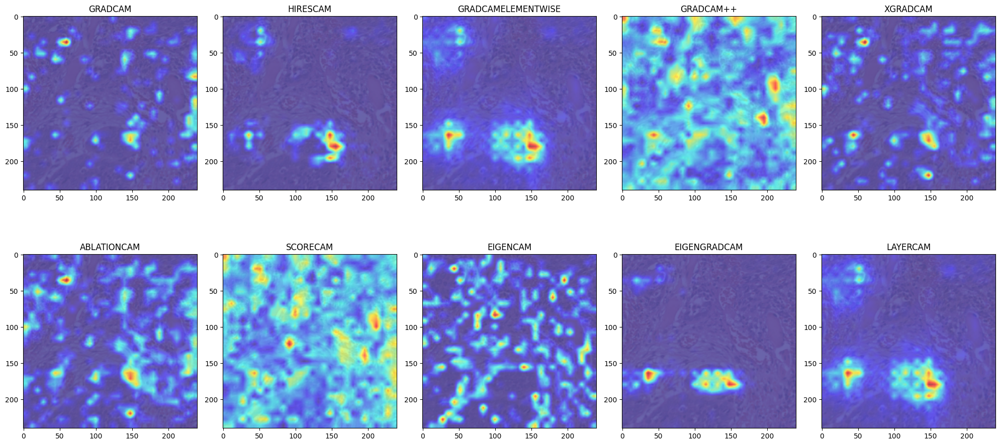

In [14]:
first_image_batch = test_image_resnet.unsqueeze(0)
plt.figure(figsize=(10, 5))

plt.subplot(1, 1, 1)
def denormalize(image):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = image.cpu().numpy().transpose((1, 2, 0))
    image = std * image + mean
    image = np.clip(image, 0, 1)
    return image

image_to_show = denormalize(image)
plt.imshow(image_to_show)
plt.imshow(mask.cpu().numpy()[0], alpha=0.5, cmap='plasma')
plt.title('Image with Mask Overlay')

plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 10))

cam_types = ["gradcam", "hirescam", "gradcamelementwise", "gradcam++", "xgradcam", "ablationcam", "scorecam", "eigencam", "eigengradcam", "layercam"]

for i, cam_type in enumerate(cam_types, 1):
    cam_image = generate_ResNet_CAM(model_resnet, first_image_batch, 0, [model_resnet.layer2[-1]], cam_type)
    
    plt.subplot(2, 5, i)  # Define a posição do subplot (2 linhas, 5 colunas)
    plt.imshow(cam_image)
    plt.title(cam_type.upper())

plt.tight_layout()
plt.show()